# Stock Market Indexes Analysis and Normal VaR Back-Testing

In this project, I woud like to use various indexes historical data to implement a back-testing framework of a given Value-at-Risk of chosen confidence and time-frame, identifying various kind of VaR breaches.

I would like to implement a streamlined approach that generates returns, standard deviations and Normal Value-at-risks calculation, which can be deployed for different indexes, and can be adjusted for different time period, chosen at the reader's discretion.

I also want to generate some useful graphs for each index, that will help the reader the context behind the choice of the Normal VaR back-testing.

## Sections:



### 1. Loading and Displaying Indexes Data:

- ###### 1.1 Setting up the Environment  
    - Importing the Relevant Libraries
- ###### 1.2 Data Pre-processing
    - The Loading Index Data: A Streamlined Function 

- ###### 1.3 Index Data Displaying 
    - S&P 500 Pricing Data
    - CAC 40 Pricing Data
    - FTSE 100 Pricing Data
    - FTSE MIB Pricing Data
    - DAX 30 Pricing Data
    
### 2. Indexes Analysis, VaR Back-testing & Breaches Discovery:

- ###### 2.1 The Data Generation Sub-Classes:
    - Returns
    - Standard Deviations
    - Index Graphs
    - Returns Graphs
    - VaR Backtesting
    
### 3. Final Results:


- ###### 3.1 Complementary Graphs 
    - S&P 500 vs Major European Stock Market Indexes (2000-2024) 
    - Indexes Returns Empirical Statistical Distributions 
    - Indexes Returns Series


- ###### 3.2 VaR Back-Testing
    - S&P 500 VaR Breaches Summary Table
    - CAC 40 VaR Breaches Summary Table
    - FTSE 100 VaR Breaches Summary Table
    - FTSE MIB VaR Breaches Summary Table
    - DAX 30 VaR Breaches Summary Table

- ###### 3.3 Forward Returns, Predicted VaR and Index Level: All in one Graph

    - S&P 500 VaR Chart  
    - CAC 40 VaR Chart  
    - FTSE 100 VaR Chart 
    - FTSE MIB VaR Chart   
    - DAX 30 VaR Chart 

- ###### 3.4 Conclusions

### 1. Loading and Displaying Indexes Data:

#### 1.1 Setting up the Environment 


##### Importing the Relevant Libraries
Let us as usual start by importing all the relevant libraries

In [1]:
# Ignore warnings - optional
import warnings
warnings.filterwarnings('ignore')
# Import data manipulation libraries
import numpy as np
import pandas as pd
# Import yahoo finance library
import yfinance as yf
# Import cufflinks for visualization
import cufflinks as cf
cf.set_config_file(offline=True)

# linear algebra libraries
from numpy.linalg import multi_dot
# statistical libraries
from scipy import stats
from scipy.stats import norm

# organise results into a table
from tabulate import tabulate

# graphs visualization
import plotly.graph_objs as go
from plotly.offline import iplot
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

# to visualize code running status
from tqdm import tqdm

#### 1.2 Loading the Data from Yahoo Finance 

- Downloading the various index data (e.g. S&P 500) data from Yahoo Finance API 

- Save the dataframe into a csv file, so there is no need to call the Yahoo Finance API multiple times

- Reading the csv file in a Pandas dataframe





#####  The Loading Index Data: A Streamlined Function 

This function will allow to input the starting and ending date for the purpose of your analysis, and it relies on the Yahoo Finance dictionary where each key (index name) is associated with the relevant Yahoo Finance code

In [2]:
# setting up a Yahoo Finance dictionary with each index name and its corresponding code
yf_dict = {'sp500':"^GSPC",'cac40': "^FCHI",'ftse100':"^FTSE",'ftsemib':"FTSEMIB.MI",'dax30':"^GDAXI"}

In [3]:
def loading_index_data(start, end):
     
    indexes_dict = {}  # Initialize an empty dictionary to store index names and CSV filenames
    
    for index_name, code in yf_dict.items():
        # performing the API call on the Yahoo Finance database
        globals()[index_name] = yf.download(code, start=start, end=end, progress=False)
        
        # Generate CSV filename
        csv_filename = f'{index_name}_data.csv'
        
        # Save the database in a CSV file using the generated filename
        globals()[index_name].to_csv(csv_filename)
        
        # Add the index name and CSV filename to the indexes_dict
        indexes_dict[index_name] = csv_filename

    # Create variables for each key
    for key, file_path in indexes_dict.items():
        # Read CSV file into a DataFrame variable with the key's name
        globals()[key] = pd.read_csv(file_path, index_col=0, parse_dates=True)
        
    return sp500, cac40, ftse100, ftsemib, dax30

# Call the loading_index_data function for the specific dates
sp500, cac40, ftse100, ftsemib, dax30 = loading_index_data('2000-01-01', '2024-01-01')

#### 1.3 Index Data Displaying 

##### S&P 500 Pricing Data

In [4]:
# showing the first 5 rows
sp500.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,1469.250000,1478.000000,1438.359985,1455.219971,1455.219971,931800000
2000-01-04,1455.219971,1455.219971,1397.430054,1399.420044,1399.420044,1009000000
2000-01-05,1399.420044,1413.270020,1377.680054,1402.109985,1402.109985,1085500000
2000-01-06,1402.109985,1411.900024,1392.099976,1403.449951,1403.449951,1092300000
2000-01-07,1403.449951,1441.469971,1400.729980,1441.469971,1441.469971,1225200000


##### CAC 40 Pricing Data

In [5]:
# showing the first 5 rows
cac40.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,6024.379883,6102.120117,5901.770020,5917.370117,5917.370117,0
2000-01-04,5922.229980,5925.069824,5657.200195,5672.020020,5672.020020,0
2000-01-05,5521.830078,5589.500000,5461.589844,5479.700195,5479.700195,0
2000-01-06,5485.930176,5530.259766,5388.850098,5450.109863,5450.109863,0
2000-01-07,5423.879883,5561.689941,5423.879883,5539.609863,5539.609863,0


##### FTSE 100 Pricing Data

In [6]:
# showing the first 5 rows
ftse100.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-04,6930.200195,6930.200195,6662.899902,6665.899902,6665.899902,633449000
2000-01-05,6665.899902,6665.899902,6500.399902,6535.899902,6535.899902,670234000
2000-01-06,6535.899902,6547.299805,6424.399902,6447.200195,6447.200195,785532000
2000-01-07,6447.200195,6532.399902,6438.799805,6504.799805,6504.799805,888306000
2000-01-10,6504.799805,6634.200195,6504.799805,6607.700195,6607.700195,735455000


##### FTSE MIB Pricing Data

In [7]:
# showing the first 5 rows
ftsemib.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,41226.0,41226.0,41226.0,41226.0,41226.0,0
2000-01-04,40314.0,40314.0,40314.0,40314.0,40314.0,0
2000-01-05,39452.0,39452.0,39452.0,39452.0,39452.0,0
2000-01-06,38835.0,38835.0,38835.0,38835.0,38835.0,0
2000-01-07,40194.0,40194.0,40194.0,40194.0,40194.0,0


##### DAX 30 Pricing Data

In [8]:
# showing the first 5 rows
dax30.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,6961.720215,7159.330078,6720.870117,6750.759766,6750.759766,43072500
2000-01-04,6747.240234,6755.359863,6510.459961,6586.950195,6586.950195,46678400
2000-01-05,6585.850098,6585.850098,6388.910156,6502.069824,6502.069824,52682800
2000-01-06,6501.450195,6539.310059,6402.629883,6474.919922,6474.919922,41180600
2000-01-07,6489.939941,6791.529785,6470.140137,6780.959961,6780.959961,56058900


### 2. Indexes Analysis, VaR Back-testing & Breaches Discovery

#### The Data Generation Class

This class will be constituted by various sub-classes that will perform the following calculations:

- ###### Returns 
(i.e. daily log returns, forward returns of a specific timeframe)

- ###### Standard Deviations 
(i.e. rolling standard deviaton of a specified window)

Log returns are defined in the below fashion:

$r_{t,t+10} =  \ln(S_{t+10}/S_{t}) = ln(S_{t+10}) - ln(S_{t}) $

They have the additivity property, in the sense that, a τ -period-log return is simply the sum of the single-period log-returns over τ /n periods, given it is additive in the exponent:

$R_{t+τ} = R_t + R_{t+1} + R_{t+2} + · · · + R_{t+n−1}$



The class will also produce the following kind of Historical graphs:

- ###### Index Graphs:

     - A chart with all Indexes Levels from a specified time period (all_indexes_chart)
     - A chart showing the Percentage Appreciation in a specified timeframe, with the data normalised to zero as a starting value (normalised_indexes_chart)
- ###### Returns Graphs:
     - Return series bar chart, showing in green the positive return and in red the the negative one
     - Daily log return statistical distribution, with a fitted Normal Probability Density Function

The Data Generation Class has a sub-class that will operate a Normal (i.e. Parametric) VaR back-testing and produces insights on the breaches occurrences over the specified back-testing period:

- ###### VaRBacktesting


     - Parametric VaR Calculation

     - The Actual Back-testing (where we can identify single and consecutive breaches, and generate a useful summary statistics table
     - The Plotting of Predicted VaR, Forward Return and the Breaches Occurred for a given Index
     
In our Parametric VaR universe, we exploit the fact that returns over a long-period are Normally distributed with near-zero mean, as you can appreciate from the empirical statistical distributions of each index.

Hence, the mean of the daily log-return is close to zero, and thus it does not impact our VaR computation.

The parametric VaR calculation is purely based on the 
\begin{equation}
VaR_{10D,t} = \Phi (1-confidence) × σ_{10D} 
\end{equation}

where we use the cumulative distribution function of a Standard Normal Random Variable:

$\Phi (a)=\frac {1}{\sqrt {2\pi }}\int _{-\infty }^{a}e^{-\frac {x^{2}}{2}}\,dx $

and

$ σ_{10D} $ is the rolling 10-day standard deviation, with a window of 21 returns (both window and time horizon can be chosen at your discretion in the class.

A breach occurs when the forward realised 10-day return is below the VaR quantity.

\begin{equation}
r_{10D,t+10} < VaR_{10D,t} 
\end{equation}

We will also identify the number of single and consecutive breaches, and compare with the expected level given our inputted confidence. 

The back-testing time period can be chosen at your discretion in the sub-class (var_timehorizon), along with the level of confidence (set to 99%) 

In [9]:
class Data_Generation:
    '''This class will produce a series of Rolling Returns and Standard Deviations, generate historical graphs, and perform VaR backtesting.'''

    def __init__(self, timeframe, window, flag, data=None, start=None, end=None, var_timehorizon=None, confidence=None, index_name=None, var_type=None):
        self.timeframe = timeframe
        self.window = window
        self.data = data
        self.flag = flag
        self.start = start
        self.end = end
        self.var_timehorizon = var_timehorizon
        self.confidence = confidence
        self.index_name = index_name
        self.var_type= var_type

    class Returns:
        '''This subclass can be used to compute any type of returns'''
        def __init__(self, timeframe, window, data, flag):
            self.timeframe = timeframe
            self.window = window
            self.data = data
            self.flag = flag

        def calculate_daily_return(self):
            '''This method calculates daily returns (Normal and Log Returns)'''
            if self.flag == 'Normal':
                self.data[f'{self.flag} Daily Return'] = self.data['Adj Close'].pct_change().dropna()
            elif self.flag == 'Log':
                self.data[f'{self.flag} Daily Return'] = np.log(self.data['Adj Close']).diff().dropna()
            return self.data[f'{self.flag} Daily Return']

        def calculate_fwd_returns(self):
            '''This method calculates Forward Returns of your chosen timeframe k (Normal and Log Returns)'''
            if self.flag == 'Normal':
                self.data[f'{self.flag} {self.timeframe}-Day Forward Return'] = self.data['Adj Close'].shift(-self.timeframe-1).dropna() - self.data['Adj Close'].shift(-1).dropna()
            elif self.flag == 'Log':
                self.data[f'{self.flag} {self.timeframe}-Day Forward Return'] = np.log(self.data['Adj Close']).shift(-self.timeframe-1).dropna() - np.log(self.data['Adj Close']).shift(-1).dropna()
            return self.data[f'{self.flag} {self.timeframe}-Day Forward Return']

    class StandardDeviations:
        '''This subclass can be used to compute any type of standard deviations'''
        def __init__(self, timeframe, window, data, flag):
            self.timeframe = timeframe
            self.window = window
            self.data = data
            self.flag = flag


        def rolling_std_generator(self):
            '''This function produces Rolling Standard Deviations of your chosen timeframe k, for simplicity we will compute rolling
            standard deviations only from Log Daily Returns'''
            if self.flag == 'Log':
                returns = Data_Generation.Returns(self.timeframe, self.window, self.data, 'Log')
                returns.calculate_daily_return()
                self.data[f'Rolling {self.timeframe}-Day Standard Deviation'] = self.data['Log Daily Return'].rolling(window=self.window).std() * np.sqrt(self.timeframe)
            return self.data[f'Rolling {self.timeframe}-Day Standard Deviation']

    class HistoricalGraphs:
        '''This class will produce a set of different graphs'''
        def __init__(self, start, end):
            self.start = start
            self.end = end
    

        class IndexGraphs:
            '''This sub-class will produce a set of different graphs on our Stock Market Index values'''
            def __init__(self, start, end):
                self.start = start
                self.end = end
        
                
            def all_indexes_chart(self):
                traces = []
                index_dict = {'S&P 500': sp500, 'CAC 40': cac40, 'FTSE 100': ftse100, 'FTSE MIB': ftsemib, 'DAX 30': dax30}
                for key, value in index_dict.items():
                    trace = go.Scatter(x=value.index, y=value['Close'], mode='lines', name=key)
                    traces.append(trace)
                layout = go.Layout(title='S&P 500 vs Major European Stock Market Indexes', xaxis=dict(title='Date'), yaxis=dict(title='Close Price'))
                fig = go.Figure(data=traces, layout=layout)
                iplot(fig)

                
            def normalised_indexes_chart(self):
                traces = []
                index_dict = {'S&P 500': sp500, 'CAC 40': cac40, 'FTSE 100': ftse100, 'FTSE MIB': ftsemib, 'DAX 30': dax30}
                for key, value in index_dict.items():
                    df = value
                    if self.start not in df.index:
                        print(f"Start date '{self.start}' does not exist in the DataFrame index for {key}.")
                        continue
                    starting_value = df.loc[self.start, 'Close']
                    df['Close_scaled'] = (df['Close'] - starting_value) / starting_value
                    trace = go.Scatter(x=df.index, y=df['Close_scaled'], mode='lines', name=key)
                    traces.append(trace)
                layout = go.Layout(
        title='S&P 500 vs Major European Stock Market Indexes (Percentage Appreciation)',
        xaxis=dict(title='Date'),
        yaxis=dict(
            title='Percentage Change',
            tickformat='.0%'  # This formats the y-axis labels as percentages
        )
    )
                fig = go.Figure(data=traces, layout=layout)
                iplot(fig)


        class ReturnsGraphs:
            '''This sub-class will produce a set of different Returns graphs'''
            def __init__(self, start, end):
                self.start = start
                self.end = end
                

            def returns_series(self):
                index_dict = {'S&P 500': sp500, 'CAC 40': cac40, 'FTSE 100': ftse100, 'FTSE MIB': ftsemib, 'DAX 30': dax30}
                
                for key, df in index_dict.items():
                    # Calculate the required returns within the date range
                    df_filtered = df.loc[self.start:self.end]
                    if 'Log Daily Return' not in df_filtered.columns:
                        print(f"'Log Daily Return' not found in {key} data.")
                        continue
                    data = df_filtered['Log Daily Return'].dropna()
                    
                    dates = data.index
                    plt.figure(figsize=(10, 6))
                    plt.bar(dates, data, color=['green' if r > 0 else 'red' for r in data])
                    plt.title(f'{key} - Daily Returns Over Time')
                    plt.xlabel('Date')
                    plt.ylabel('Return')
                    plt.grid(True)
                    ax = plt.gca()
                    ax.xaxis.set_major_locator(mdates.AutoDateLocator())
                    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
                    plt.xticks(rotation=45)
                    plt.tight_layout()
                    plt.show()



            def stat_distribution(self):
                traces = []
                index_dict1 = {'S&P 500': sp500, 'CAC 40': cac40,'FTSE 100': ftse100, 'FTSE MIB': ftsemib, 'DAX 30': dax30}
                for key, value in index_dict1.items():
                    data = value.loc[self.start:self.end, 'Log Daily Return']  # Corrected DataFrame access
                    data_refined = data.dropna()  # Drop NaN values
                    plt.figure(figsize=(10, 6))
                    plt.hist(data_refined, bins=100, density=True, alpha=0.5, label=key)
                    # PDF fitting to normal
                    mu, std = norm.fit(data_refined)
                    xmin, xmax = plt.xlim()
                    x = np.linspace(xmin, xmax, 100)
                    p = norm.pdf(x, mu, std)
                    plt.plot(x, p, label=f'{key} PDF')
                    plt.xlabel('Returns')
                    plt.ylabel('Probability Density')
                    plt.title(f'Historical Log Daily-Returns and Probability Density Function of {key}')
                    plt.legend()
                    plt.grid(False)
                    plt.show()
            

    class VaRBacktesting:
        '''This class will perform VaR Backtesting for the Parametric, Historical and Monte Carlo VaR,
        and identifies the VaR breaches occured over time and produces a chart with the relevant occurrences along with 
        the Forward Return, the Predicted VaR and the index level'''
        def __init__(self, var_timehorizon, confidence, index_name, data, var_type, timeframe, window, start, end):
            self.var_timehorizon = var_timehorizon
            self.confidence = confidence
            self.index_name = index_name
            self.data = data
            self.var_type = var_type
            self.timeframe = timeframe
            self.window = window
            self.start = start
            self.end = end
            
            # Ensure the necessary columns exist
            if f'Log {self.var_timehorizon}-Day Forward Return' not in self.data.columns:
                raise ValueError(f"Column 'Log {self.var_timehorizon}-Day Forward Return' does not exist in data.")
            
            # Filter the data based on the start and end dates
            self.data = self.data[(self.data.index > self.start) & (self.data.index < self.end)]
        def parametric_VaR(self):
            '''This function calculates Parametric (Normal) VaR'''
            
            std = Data_Generation.StandardDeviations(self.timeframe, self.window, self.data, 'Log')
            rol = std.rolling_std_generator()
            
            z_score = norm.ppf(1 - self.confidence)
            var_column_name = f'{self.var_timehorizon}-day {int(100 * self.confidence)}% Confidence Predicted VaR'
            self.data[var_column_name] = z_score * rol.dropna()
            
            return self.data[var_column_name]
        
        def var_backtesting(self):
            '''This function performs VaR Backtesting'''
            if self.var_type == 'Parametric':
                var_values = self.parametric_VaR()
            else:
                raise ValueError(f"Invalid VaR type: {self.var_type}")
            var_column_name = f'{self.var_timehorizon}-day {int(100 * self.confidence)}% Confidence Predicted VaR'
            breach_indicator_name = f'{self.var_timehorizon}-day {int(100 * self.confidence)}% Confidence {self.var_type} VaR Breach Indicator'
            consecutive_breach_name = f'{self.var_timehorizon}-day {int(100 * self.confidence)}% Confidence {self.var_type} VaR Consecutive Breaches'
            forward_return_column = f'Log {self.var_timehorizon}-Day Forward Return'
            
            self.data[breach_indicator_name] = (self.data[var_column_name] - self.data[forward_return_column] > 0).astype(int)
            self.data[consecutive_breach_name] = np.where((self.data[breach_indicator_name].shift(1) == 1) & (self.data[breach_indicator_name] == 1), 1, 0)
            
            no_of_breaches = int(np.sum(self.data[breach_indicator_name] == 1))
            expected_no_of_breaches = int((1 - self.confidence) * self.data[forward_return_column].dropna().count())
            no_of_consec_breaches = int(np.sum(self.data[consecutive_breach_name] == 1))
            
            num_data = len(self.data[forward_return_column])
            no_of_breaches_pctg = round(no_of_breaches / num_data, 4) * 100
            expected_no_of_breaches_pctg = round(expected_no_of_breaches / num_data, 2) * 100
            no_of_consec_breaches_pctg = round(no_of_consec_breaches / num_data, 4) * 100
            
            results_dict = {
            'Metric': ['Actual Number of Breaches', 
                       f'Expected Number of Breaches (at {int(100 * self.confidence)}% Confidence)', 
                       'Number of Consecutive Breaches'],
            'Value in Number Terms': [no_of_breaches, expected_no_of_breaches, no_of_consec_breaches],
            'Value in % Terms': [no_of_breaches_pctg, expected_no_of_breaches_pctg, no_of_consec_breaches_pctg]
        }
            
            breaches_df = pd.DataFrame(results_dict)
            
            print(f"According to our {self.var_timehorizon}-day {int(100 * self.confidence)}% Confidence {self.var_type} VaR model, for the {self.index_name} Index the singular and consecutive breaches vs the expected ones are:")
            print("")
            
            return breaches_df
        
        def var_fwd_return_chart(self):
            '''The function shows the historical VaR breaches occurred over the specified time-frame, along with 
        the Forward return and the Predicted VaR, and the index level on a separate axis'''
            if self.var_type == 'Parametric':
                var_values = self.parametric_VaR()
            else:
                raise ValueError(f"Invalid VaR type: {self.var_type}")
                
            var_column_name = f'{self.var_timehorizon}-day {int(100 * self.confidence)}% Confidence Predicted VaR'
            forward_return_column = f'Log {self.var_timehorizon}-Day Forward Return'
            
            trace1 = go.Scatter(x=self.data.index, y=self.data['Adj Close'], mode='lines', name='Adj Close', yaxis='y1')
            trace2 = go.Scatter(x=self.data.index, y=self.data[forward_return_column], mode='lines', name=f'{self.var_timehorizon} Day Forward Return', line=dict(color='red'), yaxis='y2')
            trace3 = go.Scatter(x=self.data.index, y=self.data[var_column_name], mode='lines', name=var_column_name, line=dict(color='green'), yaxis='y2')
            
            breaches_points = [(self.data.index[i], self.data[forward_return_column].iloc[i]) 
            for i in range(len(self.data))
                if self.data[forward_return_column].iloc[i] <= self.data[var_column_name].iloc[i]]
            
            marker_trace = go.Scatter(
            x=[point[0] for point in breaches_points], 
            y=[point[1] for point in breaches_points],
            mode='markers',
            marker=dict(symbol='star', color='blue', size=10),
            name='Breaches Occurrences',
            yaxis='y2'
        )
            data = [trace1, trace2, trace3, marker_trace]
            
            layout = go.Layout(title=f'{self.index_name} {self.var_timehorizon}-day {int(100 * self.confidence)} % Confidence {self.var_type} VaR Backtesting vs {self.var_timehorizon}-Day Forward Return',
                           xaxis=dict(title='Date'),
                           yaxis=dict(title=f'{self.index_name} Close', side='left', showgrid=False),
                           yaxis2=dict(title='Return/VaR', side='right', overlaying='y', showgrid=False),
                           width=900,
                           height=900
                          )
            fig = go.Figure(data=data, layout=layout)
            
            return fig

## 3. Final Results

In this section, we will present the results for each index, the associated charts and the VaR back-testing analysis.

In [10]:
# Defining the dictionary with Index names associated to the respective dataframe
index_dict = {
    'S&P 500': sp500,
    'CAC 40': cac40,
    'FTSE 100': ftse100,
    'FTSE MIB': ftsemib,
    'DAX 30': dax30
}

# looping through each key and value of the dictionary
for key, value in index_dict.items():
    d = Data_Generation(10, 20, value, 'Log', '2000-01-01', '2024-01-01', 10, 0.99, key)
    ret = d.Returns(10, 20, value, 'Log')
    daily_ret = ret.calculate_daily_return()
    fwd_ret = ret.calculate_fwd_returns()
    s = d.StandardDeviations(10,20,value,'Log')
    rol_std = s.rolling_std_generator()
    

sp500
    

,Open,High,Low,Close,Adj Close,Volume,Log Daily Return,Log 10-Day Forward Return,Rolling 10-Day Standard Deviation
Date,,,,,,,,,
2000-01-03,1469.250000,1478.000000,1438.359985,1455.219971,1455.219971,931800000,NaN,0.039566,NaN
2000-01-04,1455.219971,1455.219971,1397.430054,1399.420044,1399.420044,1009000000,-0.039099,0.030525,NaN
2000-01-05,1399.420044,1413.270020,1377.680054,1402.109985,1402.109985,1085500000,0.001920,0.026654,NaN
2000-01-06,1402.109985,1411.900024,1392.099976,1403.449951,1403.449951,1092300000,0.000955,-0.028099,NaN
2000-01-07,1403.449951,1441.469971,1400.729980,1441.469971,1441.469971,1225200000,0.026730,-0.033180,NaN
...,...,...,...,...,...,...,...,...,...
2023-12-22,4753.919922,4772.939941,4736.770020,4754.629883,4754.629883,3046770000,0.001659,NaN,0.019188
2023-12-26,4758.859863,4784.720215,4758.450195,4774.750000,4774.750000,2513910000,0.004223,NaN,0.018997
2023-12-27,4773.450195,4785.390137,4768.899902,4781.580078,4781.580078,2748450000,0.001429,NaN,0.018982


### 3.1 Complementary Graphs

#### S&P 500 vs Major European Stock Market Indexes (2000-2024)

In [11]:
d = Data_Generation(10, 20, 'Log', '2000-01-01', '2024-01-01', 10, 0.99)
h = d.HistoricalGraphs('2000-01-01', '2024-01-01')
i = h.IndexGraphs('2000-01-01', '2024-01-01')
a_chart = i.all_indexes_chart()


In [12]:
# Example usage
d = Data_Generation(10, 20, 'Log', '2000-01-04', '2024-01-01', 10, 0.99)
h = d.HistoricalGraphs('2000-01-04', '2024-01-01')
i = h.IndexGraphs('2000-01-04', '2024-01-01')
n_chart = i.normalised_indexes_chart()

#### Indexes Returns Empirical Statistical Distributions 

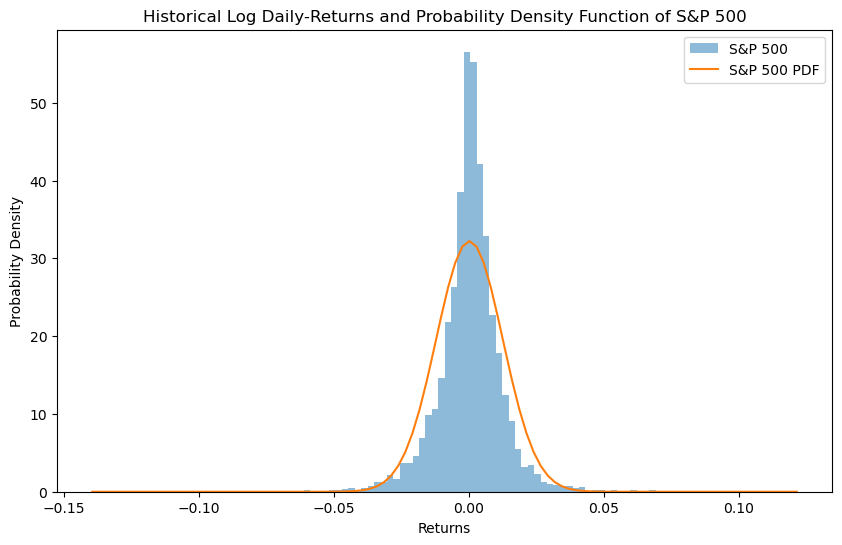

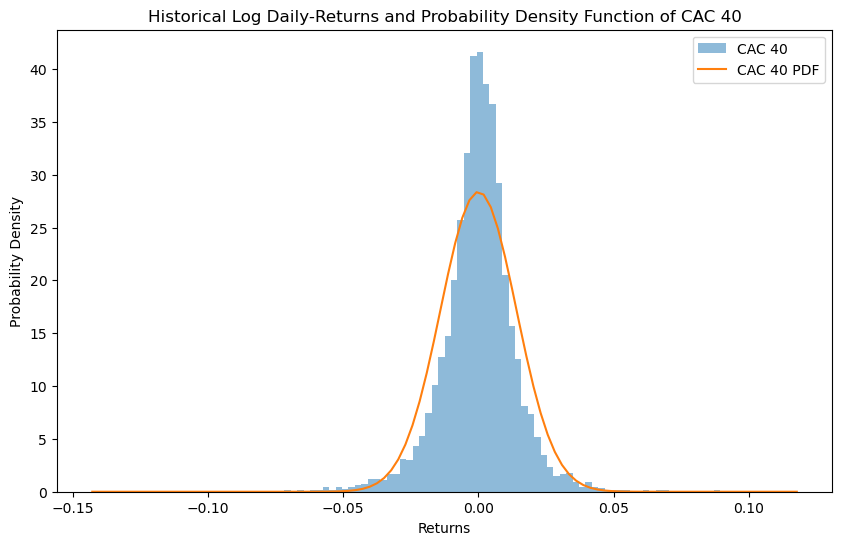

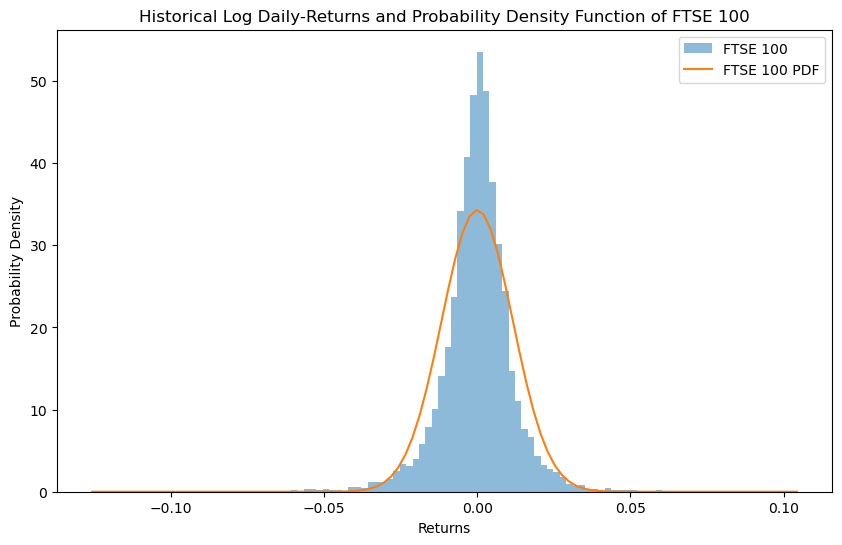

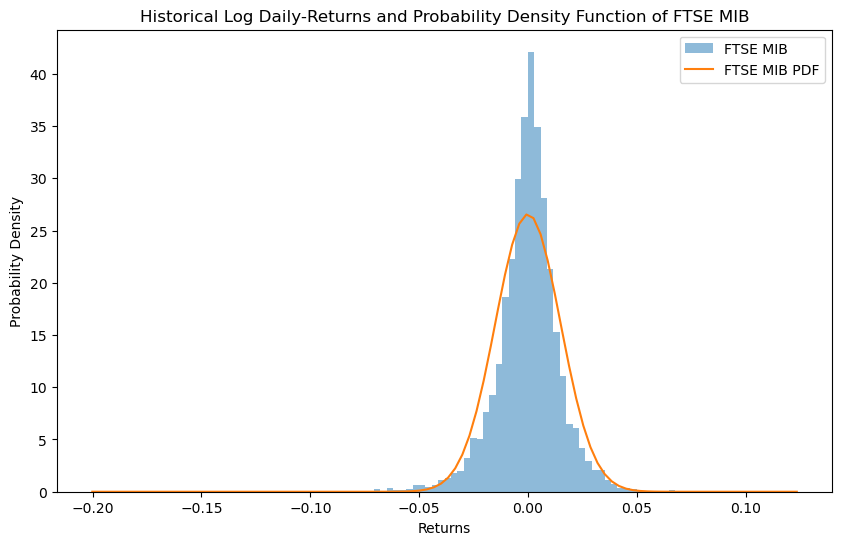

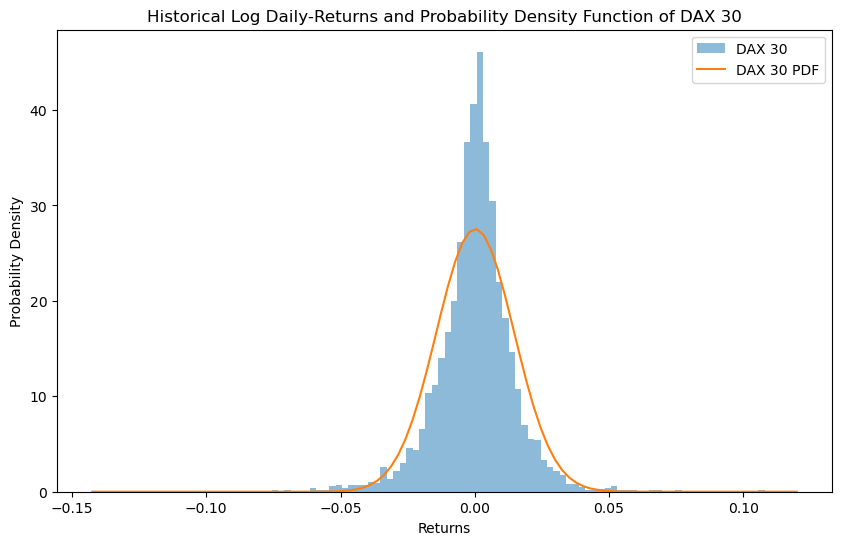

In [14]:
d = Data_Generation(10, 20, 'Log', '2000-01-04', '2024-01-01', 10, 0.99)
h = d.HistoricalGraphs('2000-01-04', '2024-01-01')
i = h.ReturnsGraphs('2000-01-04', '2024-01-01')
ret_dist = i.stat_distribution()

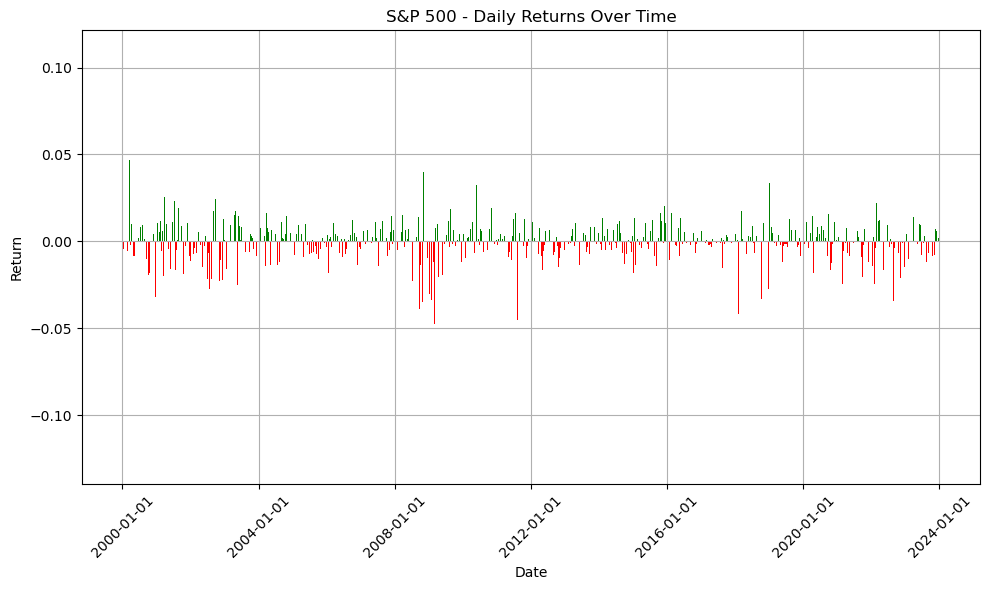

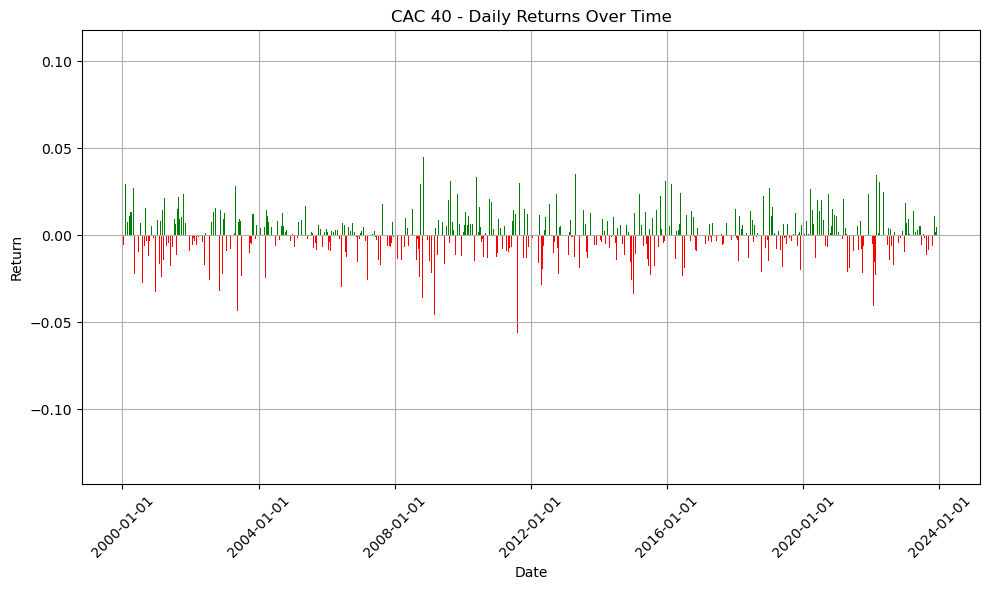

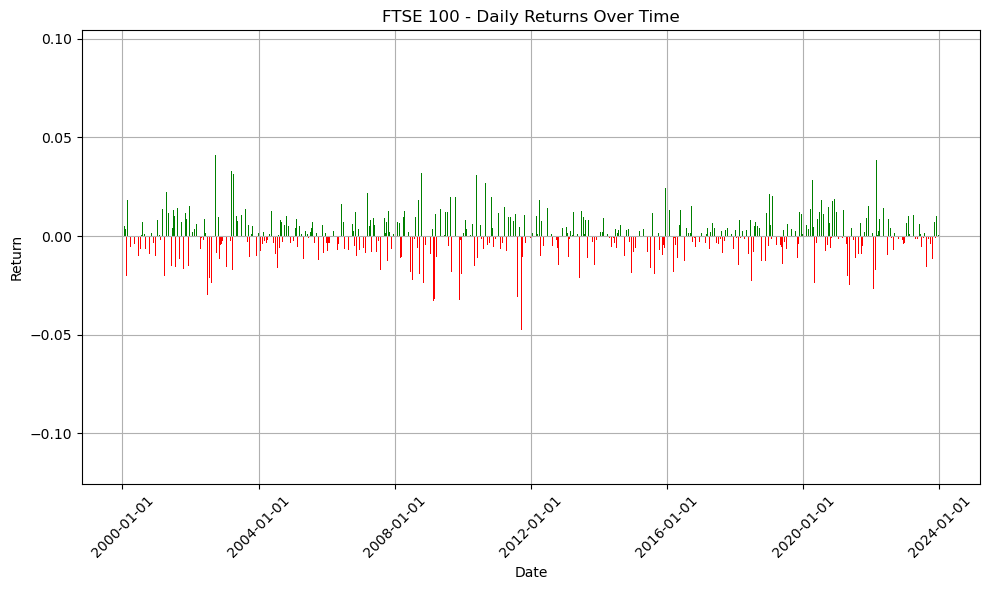

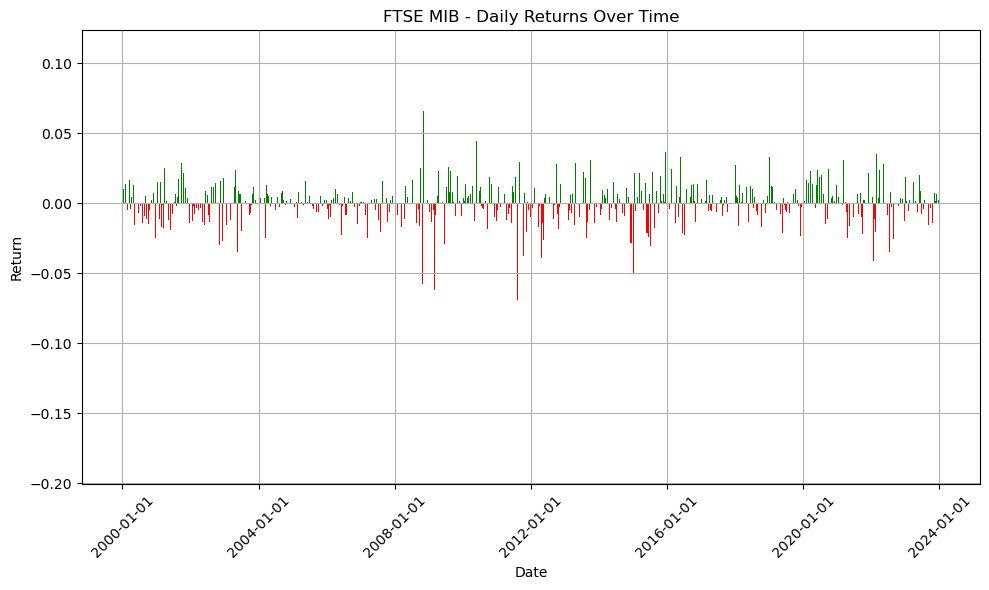

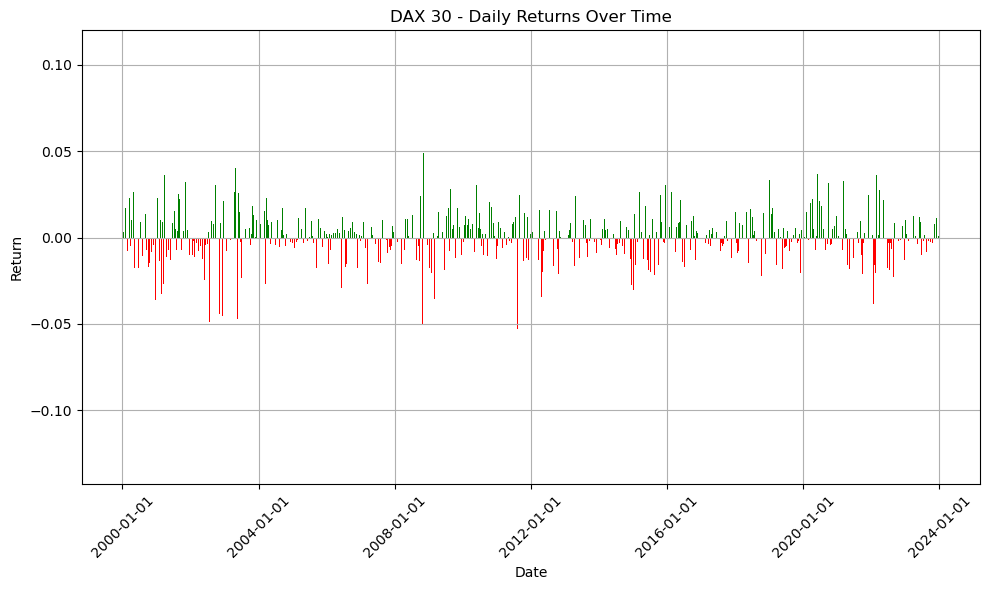

In [15]:
d = Data_Generation(10, 20, 'Log', '2000-01-04', '2024-01-01', 10, 0.99)
h = d.HistoricalGraphs('2000-01-04', '2024-01-01')
i = h.ReturnsGraphs('2000-01-04', '2024-01-01')
ret_dist = i.returns_series()

### 3.2 VaR Back-Testing

#### S&P 500 VaR Breaches Summary Table

In [13]:
d = Data_Generation(10, 21, 'Log', '2000-01-04', '2024-01-01', 10, 0.99)
v = d.VaRBacktesting(10, 0.99, 'S&P 500', sp500, 'Parametric', 10, 21, '2013-01-23', '2018-01-06')
back_test = v.var_backtesting()

back_test

According to our 10-day 99% Confidence Parametric VaR model, for the S&P 500 Index the singular and consecutive breaches vs the expected ones are:



,Metric,Value in Number Terms,Value in % Terms
0,Actual Number of Breaches,25,2.00
1,Expected Number of Breaches (at 99% Confidence),12,1.00
2,Number of Consecutive Breaches,14,1.12


#### CAC 40 VaR Breaches Summary Table

In [14]:
d = Data_Generation(10, 21, 'Log', '2000-01-04', '2024-01-01', 10, 0.99)
v = d.VaRBacktesting(10, 0.99, 'CAC 40', cac40, 'Parametric', 10, 21, '2013-01-23', '2018-01-06')
back_test = v.var_backtesting()

back_test

According to our 10-day 99% Confidence Parametric VaR model, for the CAC 40 Index the singular and consecutive breaches vs the expected ones are:



,Metric,Value in Number Terms,Value in % Terms
0,Actual Number of Breaches,27,2.13
1,Expected Number of Breaches (at 99% Confidence),12,1.00
2,Number of Consecutive Breaches,16,1.26


#### FTSE 100 VaR Breaches Summary Table

In [15]:
d = Data_Generation(10, 21, 'Log', '2000-01-04', '2024-01-01', 10, 0.99)
v = d.VaRBacktesting(10, 0.99, 'FTSE 100', ftse100, 'Parametric', 10, 21, '2013-01-23', '2018-01-06')
back_test = v.var_backtesting()

back_test

According to our 10-day 99% Confidence Parametric VaR model, for the FTSE 100 Index the singular and consecutive breaches vs the expected ones are:



,Metric,Value in Number Terms,Value in % Terms
0,Actual Number of Breaches,33,2.64
1,Expected Number of Breaches (at 99% Confidence),12,1.00
2,Number of Consecutive Breaches,20,1.60


#### FTSE MIB VaR Breaches Summary Table

In [16]:
d = Data_Generation(10, 21, 'Log', '2000-01-04', '2024-01-01', 10, 0.99)
v1 = d.VaRBacktesting(10, 0.99, 'FTSE MIB', ftsemib, 'Parametric', 10, 21, '2013-01-23', '2018-01-06')
back_test = v1.var_backtesting()

back_test

According to our 10-day 99% Confidence Parametric VaR model, for the FTSE MIB Index the singular and consecutive breaches vs the expected ones are:



,Metric,Value in Number Terms,Value in % Terms
0,Actual Number of Breaches,9,0.72
1,Expected Number of Breaches (at 99% Confidence),12,1.00
2,Number of Consecutive Breaches,1,0.08


#### DAX 30 VaR Breaches Summary Table

In [17]:
d = Data_Generation(10, 21, 'Log', '2000-01-04', '2024-01-01', 10, 0.99)
v1 = d.VaRBacktesting(10, 0.99, 'DAX 30', dax30, 'Parametric', 10, 21, '2013-01-23', '2018-01-06')
back_test = v1.var_backtesting()

back_test

According to our 10-day 99% Confidence Parametric VaR model, for the DAX 30 Index the singular and consecutive breaches vs the expected ones are:



,Metric,Value in Number Terms,Value in % Terms
0,Actual Number of Breaches,27,2.16
1,Expected Number of Breaches (at 99% Confidence),12,1.00
2,Number of Consecutive Breaches,18,1.44


### 3.3 Forward Returns, Predicted VaR and Index Level: All in one Graph

In [18]:
d = Data_Generation(10, 21, 'Log', '2000-01-04', '2024-01-01', 10, 0.99)
v = d.VaRBacktesting(10, 0.99, 'S&P 500', sp500, 'Parametric', 10, 21, '2013-01-23', '2018-01-06')
chart = v.var_fwd_return_chart()

chart

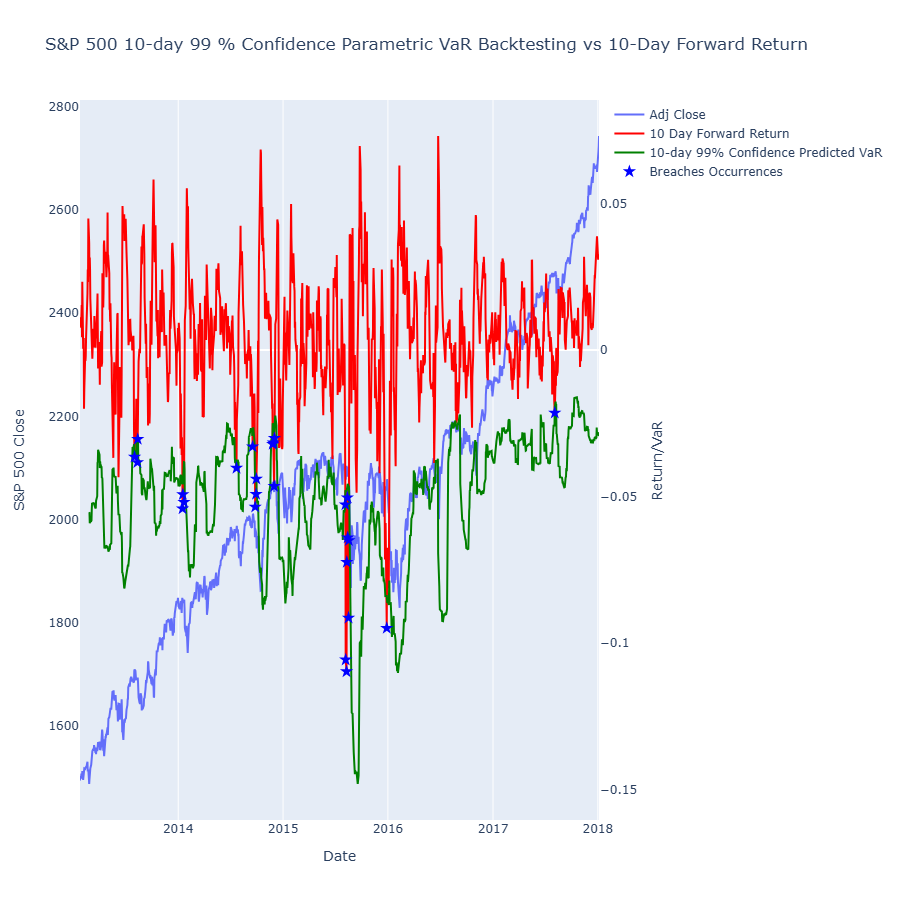


In [19]:
d = Data_Generation(10, 21, 'Log', '2000-01-04', '2024-01-01', 10, 0.99)
v = d.VaRBacktesting(10, 0.99, 'CAC 40', cac40, 'Parametric', 10, 21, '2013-01-23', '2018-01-06')
chart = v.var_fwd_return_chart()

chart

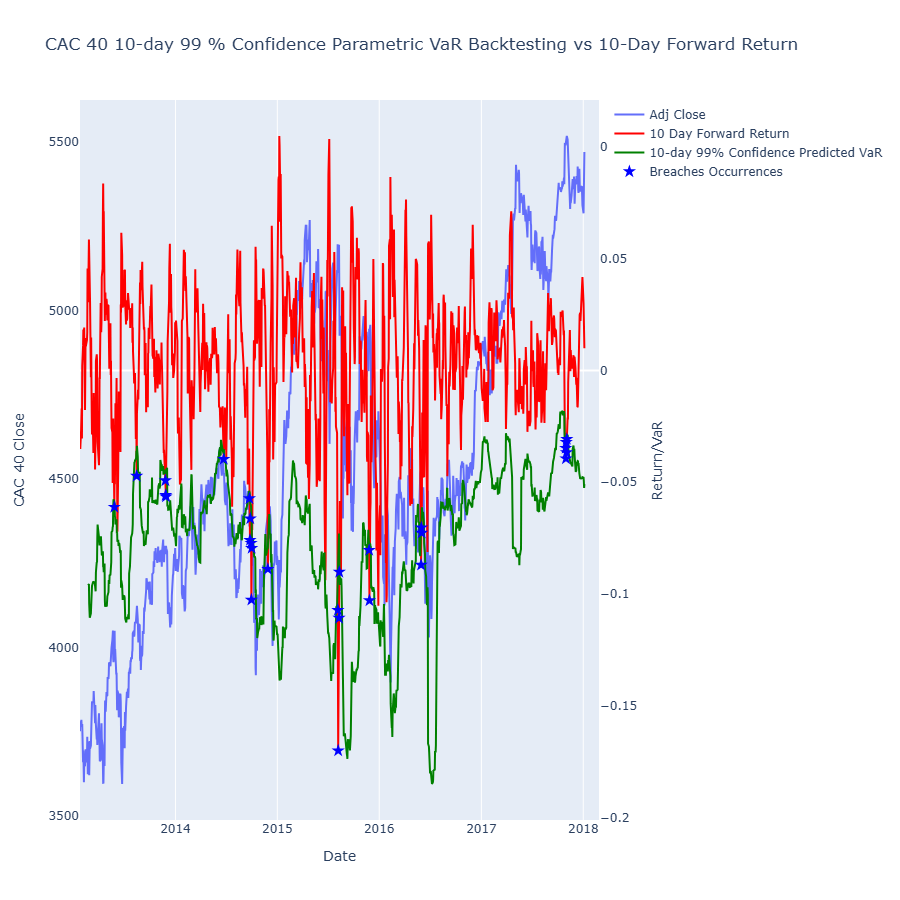

In [20]:
d = Data_Generation(10, 21, 'Log', '2000-01-04', '2024-01-01', 10, 0.99)
v = d.VaRBacktesting(10, 0.99, 'FTSE 100', ftse100, 'Parametric', 10, 21, '2013-01-23', '2018-01-06')
chart = v.var_fwd_return_chart()

chart

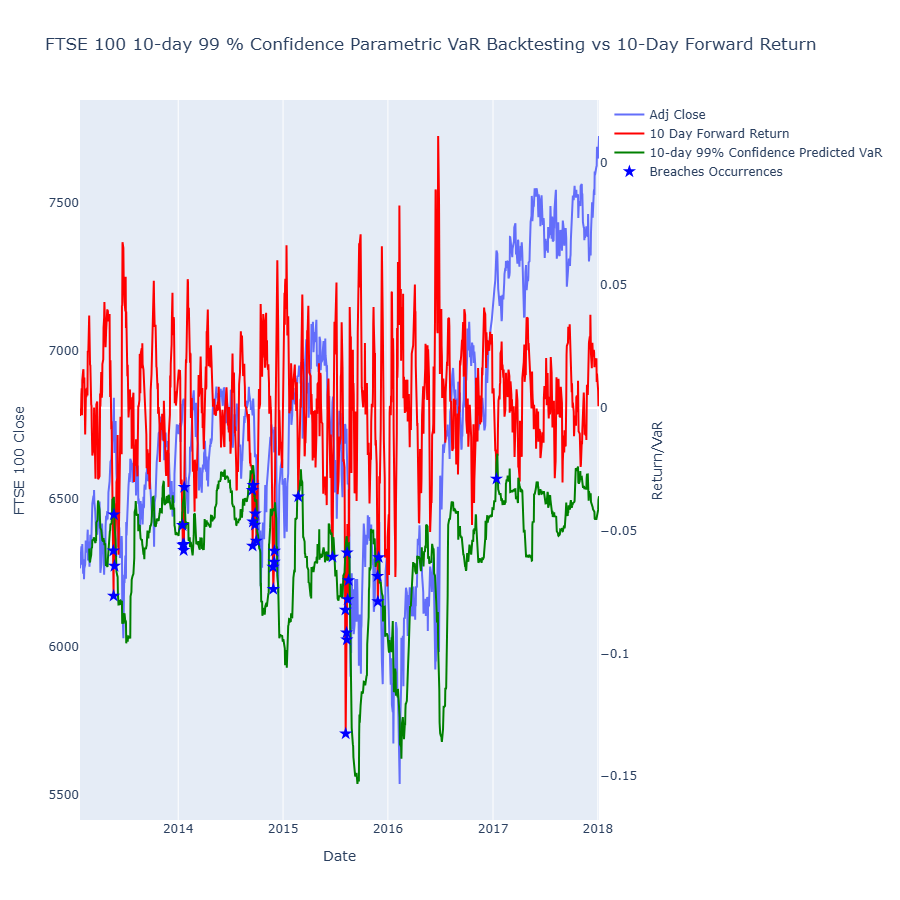

In [21]:
d = Data_Generation(10, 21, 'Log', '2000-01-04', '2024-01-01', 10, 0.99)
v1 = d.VaRBacktesting(10, 0.99, 'FTSE MIB', ftsemib, 'Parametric', 10, 21, '2013-01-23', '2018-01-06')

chart = v1.var_fwd_return_chart()

chart

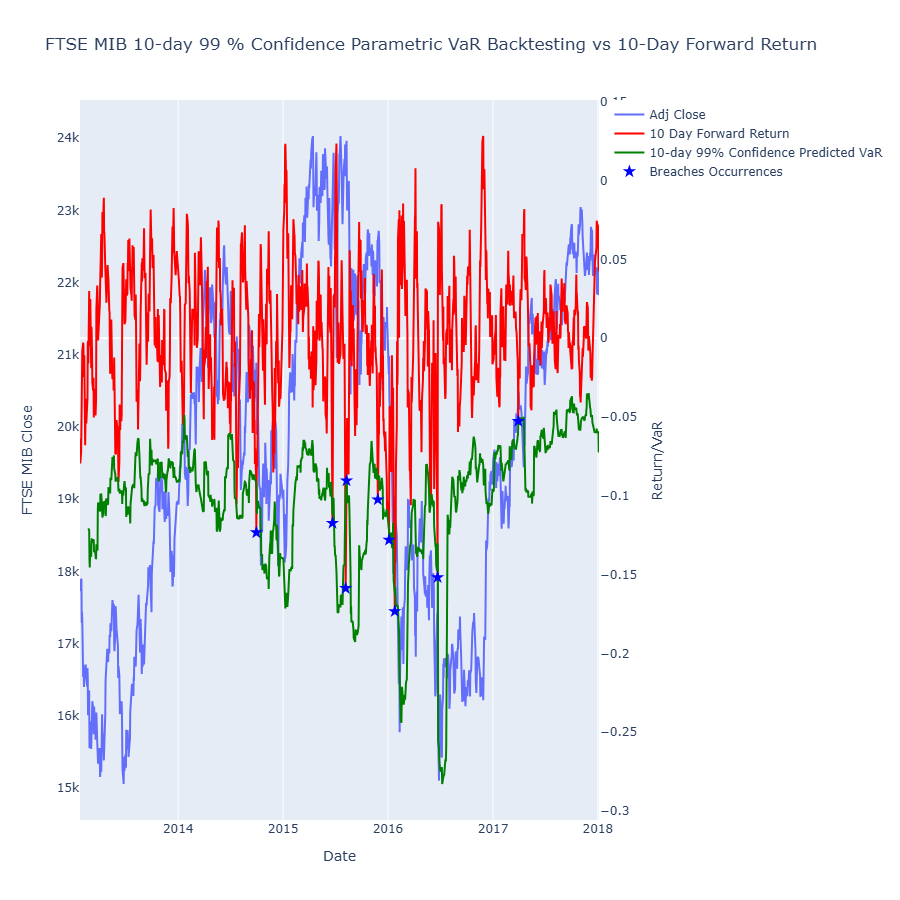

In [22]:
d = Data_Generation(10, 21, 'Log', '2000-01-04', '2024-01-01', 10, 0.99)
v1 = d.VaRBacktesting(10, 0.99, 'DAX 30', dax30, 'Parametric', 10, 21, '2013-01-23', '2018-01-06')

chart = v1.var_fwd_return_chart()

chart

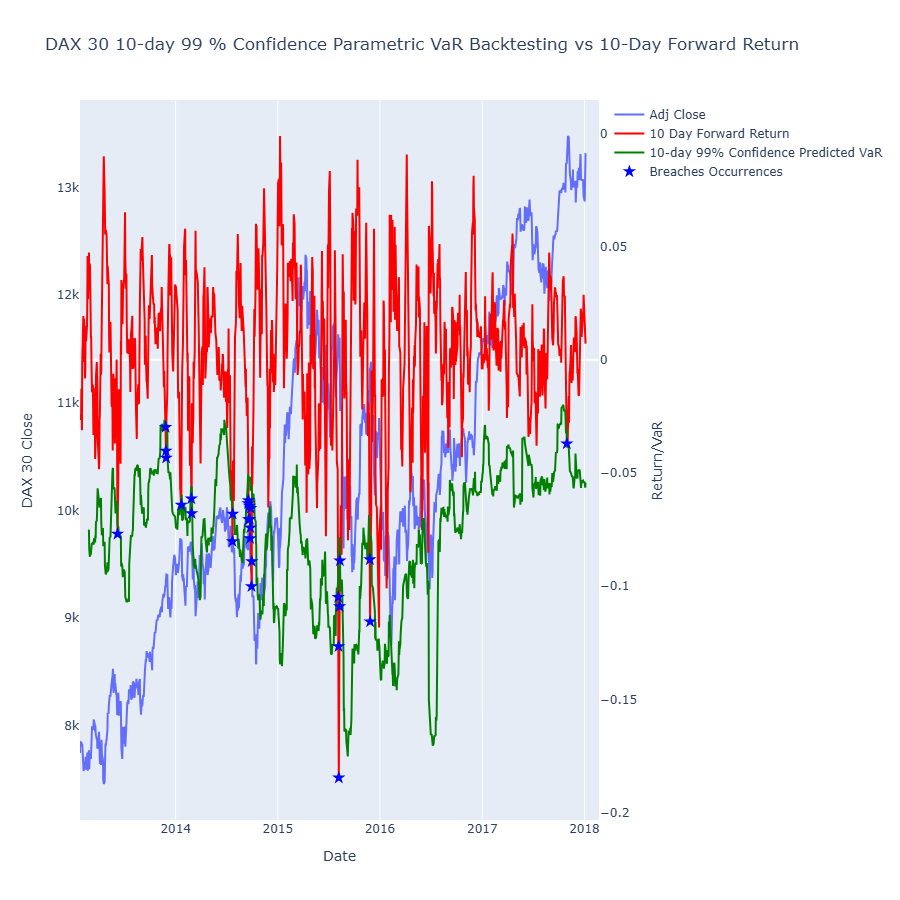

### 3.4 Conclusions

The above research presents an innovative approach to VaR back-testing, and incorporates a set of tools (i.e. charting) into a one-piece Class that is efficient in producing the needed information.

On the charts and tables itself, with respect to the back-testing period chosen, there are evident relationships between indexes, and the number of breaches. I will let the reader come up with their own conclusions and tailor their own analysis based on this ready-made approach via the Data Generation class, by opting for different underlying variables (e.g. back-testing period).

Thank you for reading!